# Oil and Gas Knowledge Graph

Código baseado no tutorial de Chris Thornton, [Auto-Generated Knowledge Graphs](https://towardsdatascience.com/auto-generated-knowledge-graphs-92ca99a81121).

In [49]:
# Importando os bibliotecas
import pandas as pd
import re
import spacy
import neuralcoref
import networkx as nx
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor

### Carregando o dataset  

inicialmente vamos utilizar o corpus público do [Petrolês](https://petroles.puc-rio.ai/) sem as teses do IBICT, com o preprocessamento disponibilizado (apenas eliminação de ruídos, números e caracteres especiais). Ao final, a escolha do corpus deve ser reavaliada. 

In [8]:
file = 'corpusPublico(sem IBICT)-SemProcessamento.txt'
text = open(file, "r", encoding='utf-8').read()
#text = text.split('\n')

In [9]:
print('Número de sentenças: ', len(text))

Número de sentenças:  526158850


In [21]:

string = '. '.join([linha.strip() for linha in text[:526158].split('\n')])

file2 = 'corpusPublico(sem IBICT)-small.txt'
with open(file2, 'w', encoding='utf-8') as output_file:
    output_file.write(string)

### Computational Linguistics & NLP Algorithms  
"Knowledge graphs can be constructed automatically from text using part-of-speech and dependency parsing. The extraction of entity pairs from grammatical patterns is fast and scalable to large amounts of text using NLP library SpaCy.
The following function defines entity pairs as entities/noun chunks with subject — object dependencies connected by a root verb. Other rules-of-thumb can be used to produce different types of connections. This kind of connection can be referred to as a subject-predicate-object triple."

In [51]:
# Usando a versão reduzida do modelo da língua portuguesa
# Depois testar outras versões

nlp = spacy.load('pt_core_news_sm')  
# neuralcoref.add_to_pipe(nlp) #usar apenas em textos em inglês

In [9]:
def refine_ent(ent, sent):
    unwanted_tokens = (
        'PRON',  # pronouns
        'PART',  # particle
        'DET',  # determiner
        'SCONJ',  # subordinating conjunction
        'PUNCT',  # punctuation
        'SYM',  # symbol
        'X',  # other
    )
    ent_type = ent.ent_type_  # get entity type
    if ent_type == '':
        ent_type = 'NOUN_CHUNK'
        ent = ' '.join(str(t.text) for t in
                       nlp(str(ent)) if t.pos_
                       not in unwanted_tokens and t.is_stop == False)
    elif ent_type in ('NOMINAL', 'CARDINAL', 'ORDINAL') and str(ent).find(' ') == -1:
        refined = ''
        for i in range(len(sent) - ent.i):
            if ent.nbor(i).pos_ not in ('VERB', 'PUNCT'):
                refined += ' ' + str(ent.nbor(i))
            else:
                ent = refined.strip()
                break

    return ent, ent_type

Paralelizar o código

In [22]:
ent_pairs = []
n_sent = 10000

def get_triple(sent):
    
    ent_pairs_pool = []

    #for sent in text:

    #n_sent = n_sent + 1
    sent = nlp(sent)
    spans = list(sent.ents) + list(sent.noun_chunks)  # collect nodes
    spans = spacy.util.filter_spans(spans)
    with sent.retokenize() as retokenizer:
        [retokenizer.merge(span, attrs={'tag': span.root.tag,
                                        'dep': span.root.dep}) for span in spans]
    deps = [token.dep_ for token in sent]


    # limit our example to simple sentences with one subject and object
    if (deps.count('obj') + deps.count('dobj')) != 1\
            or (deps.count('subj') + deps.count('nsubj')) != 1:
    #if (deps.count('obj') + deps.count('dobj')) != 1\
    #        or (deps.count('subj')) != 1:
        return

    for token in sent:
        if token.dep_ not in ('obj', 'dobj'):  # identify object nodes
            continue
        subject = [w for w in token.head.lefts if w.dep_
                   in ('subj', 'nsubj')]  # identify subject nodes
        if subject:
            subject = subject[0]
            # identify relationship by root dependency
            relation = [w for w in token.ancestors if w.dep_ == 'ROOT']
            if relation:
                relation = relation[0]
                # add adposition or particle to relationship
                if relation.nbor(1).pos_ in ('ADP', 'PART'):
                    relation = ' '.join((str(relation), str(relation.nbor(1))))
            else:
                relation = 'unknown'

            subject, subject_type = refine_ent(subject, sent)
            token, object_type = refine_ent(token, sent)

            ent_pairs_pool.append([str(subject), str(relation), str(token),
                              str(subject_type), str(object_type), sent])
            

    #print (ent_pairs_pool[0])
    ent_pairs.append(ent_pairs_pool[0])

    
    return (ent_pairs_pool[0])

with ThreadPoolExecutor(10) as pool:
    pool.map(get_triple, text[:n_sent])

            
not_ent = ['', '<', 'NUMBER' ]
        
ent_pairs = [sublist for sublist in ent_pairs
                      if not any(str(ent) in not_ent for ent in sublist)]


pairs = pd.DataFrame(ent_pairs, columns=['subject', 'relation', 'object',
                                         'subject_type', 'object_type', 'sentença'])
print('Entity pairs extracted:', str(len(ent_pairs)))
print('Número de sentenças análisadas: ', n_sent)

Entity pairs extracted: 662
Número de sentenças análisadas:  10000


In [23]:
pairs

,subject,relation,object,subject_type,object_type,sentença
0,integração,proporciona,ganhos,NOUN_CHUNK,NOUN_CHUNK,"(A, integração, das, atividades, da, cadeia, n..."
1,monopólio,ligado,tamanho,NOUN_CHUNK,NOUN_CHUNK,"(<, NUMBER, >, O, monopólio, natural, está, li..."
2,atividade,pode,gasodutos,NOUN_CHUNK,NOUN_CHUNK,"(<, NUMBER, >, A, atividade, de, transporte, p..."
3,modo,proporcionou,ganhos,NOUN_CHUNK,NOUN_CHUNK,"(Esse, modo, de, organização, industrial, prop..."
4,empresa,detinha,monopólio,NOUN_CHUNK,NOUN_CHUNK,"(A, empresa, detinha, o, monopólio, legal, das..."
...,...,...,...,...,...,...
657,países,planejando,adoção,NOUN_CHUNK,NOUN_CHUNK,"(Outros, países, europeus, estão, também, plan..."
658,Dinamarca,tem,taxa,LOC,NOUN_CHUNK,"(Por, exemplo, a, Dinamarca, tem, uma, taxa, d..."
659,Países,têm,taxas,NOUN_CHUNK,NOUN_CHUNK,"(Países, com, este, tipo, de, estrutura, tribu..."
660,taxas,dependem,impostos,NOUN_CHUNK,NOUN_CHUNK,"(Não, obstante, taxas, elevadas, de, motorizaç..."


Plotando o grafo

In [24]:
def draw_kg(pairs):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(120, 90), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 500 for deg in node_deg],
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white',
        )
    labels = dict(zip(list(zip(pairs.subject, pairs.object)),
                  pairs['relation'].tolist()))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.show()

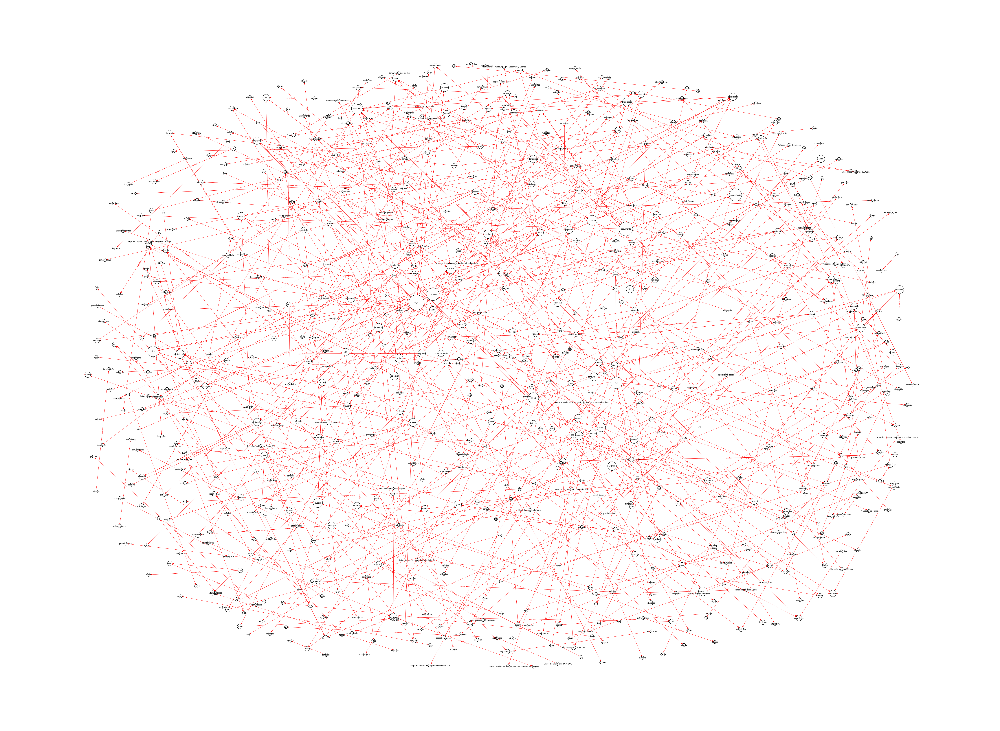

In [25]:
draw_kg(pairs)

In [26]:
def filter_graph(pairs, node, depth_limit):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    edges = nx.dfs_successors(k_graph, node, depth_limit=depth_limit)
    nodes = []
    for k, v in edges.items():
        nodes.extend([k])
        nodes.extend(v)
    subgraph = k_graph.subgraph(nodes)
    layout = (nx.random_layout(k_graph))
    plt.figure(num=None, figsize=(20, 20))
    nx.draw_networkx(
        subgraph,
        node_size=1000,
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white'
        )
    labels = dict(zip((list(zip(pairs.subject, pairs.object))),
                    pairs['relation'].tolist()))
    edges= tuple(subgraph.out_edges(data=False))
    sublabels ={k: labels[k] for k in edges}
    nx.draw_networkx_edge_labels(subgraph, pos=layout, edge_labels=sublabels,
                                font_color='red')
    plt.axis('off')
    plt.show()

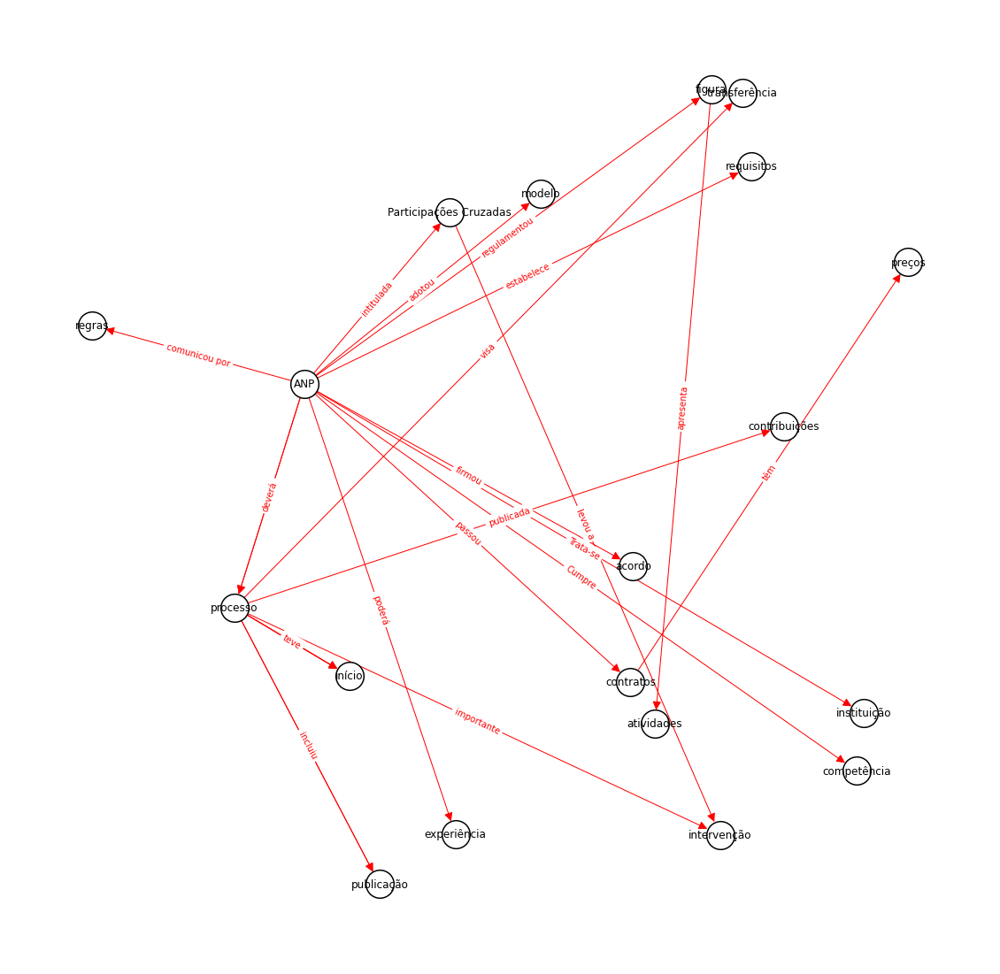

In [29]:
filter_graph(pairs, 'ANP', 2)

In [30]:
k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
        create_using=nx.MultiDiGraph())

In [34]:
#nx.degree_histogram(k_graph)
[x for x in k_graph.degree if x[1] >5]

#k_graph.degree['ANP']

[('ganhos', 7),
 ('participação', 7),
 ('modelo', 6),
 ('resultados', 6),
 ('processo', 14),
 ('crescimento', 12),
 ('início', 10),
 ('ANP', 12),
 ('seção', 21),
 ('análise', 6),
 ('trabalho', 6),
 ('aumento', 9),
 ('redução', 6),
 ('objetivo', 6),
 ('inclusão', 9),
 ('Tabela', 10),
 ('Petrobras', 6),
 ('custos', 8),
 ('consumidores', 6),
 ('distribuição', 6),
 ('conclusões', 6),
 ('documento', 17),
 ('manifestação', 14),
 ('consumo', 7),
 ('UNITED', 7),
 ('ENERGY', 7),
 ('minimização', 6)]

In [32]:
len(set(pairs['subject']+pairs['object']))

581

In [66]:
doc = nlp(text[1000])
for chunk in doc.noun_chunks:
    print(chunk.text) #, chunk.root.text, chunk.root.dep_,
            #chunk.root.head.text)